In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df_temp = open_data.open()
df = df_temp[0]

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=2500, burnin=1000)

19:49:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:56 - cmdstanpy - INFO - CmdStan done processing.
20:05:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/OnlyCovariates/code.stan', line 157, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/OnlyCovariates/code.stan', line 157, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/OnlyCovariates/code.stan', line 157, column 4 to column 34)
	Exception: code_model_namespace::log_prob: phi[2][1] is -nan, but must be greater than or equal to -1.000000 (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/OnlyCovariates/code.stan', line 87, column 2 to column 47)
	Exception: normal_lpdf: Scale parameter is 0, but must 

/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/fit_arima.py:41: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 16:05

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True)
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  7196.51   155.72
p_loo      260.37        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17096   99.4%
 (0.5, 0.7]   (ok)          82    0.5%
   (0.7, 1]   (bad)         13    0.1%
   (1, Inf)   (very bad)     0    0.0%

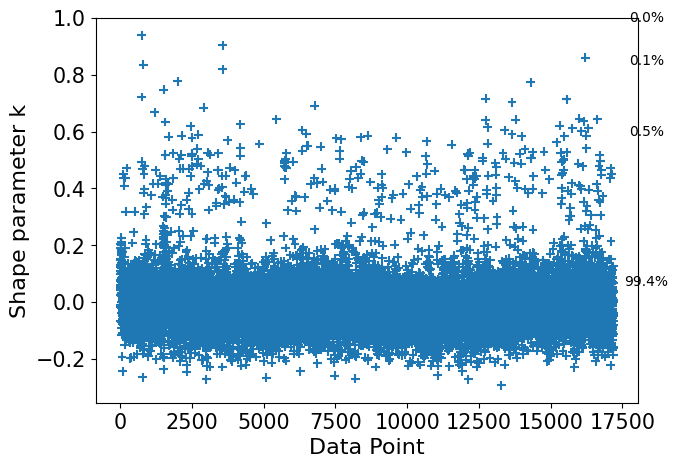

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik")
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  7208.48   155.58
p_waic      248.40        -

There has been a warning during the calculation. Please check the results.

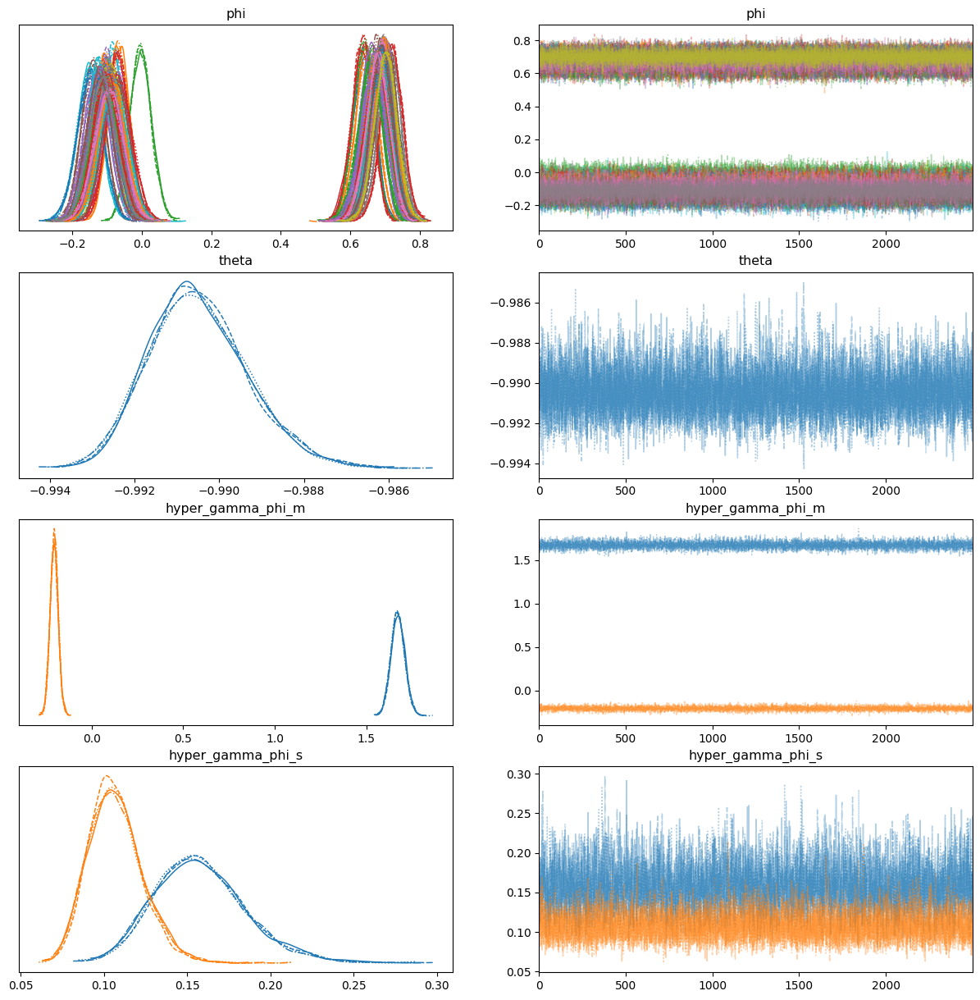

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

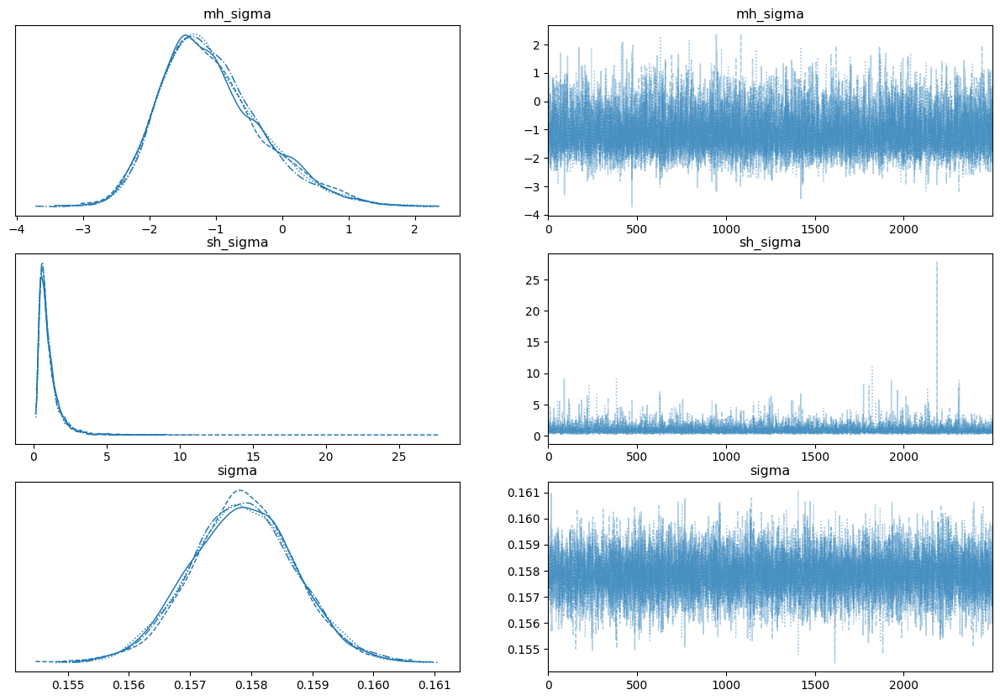

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

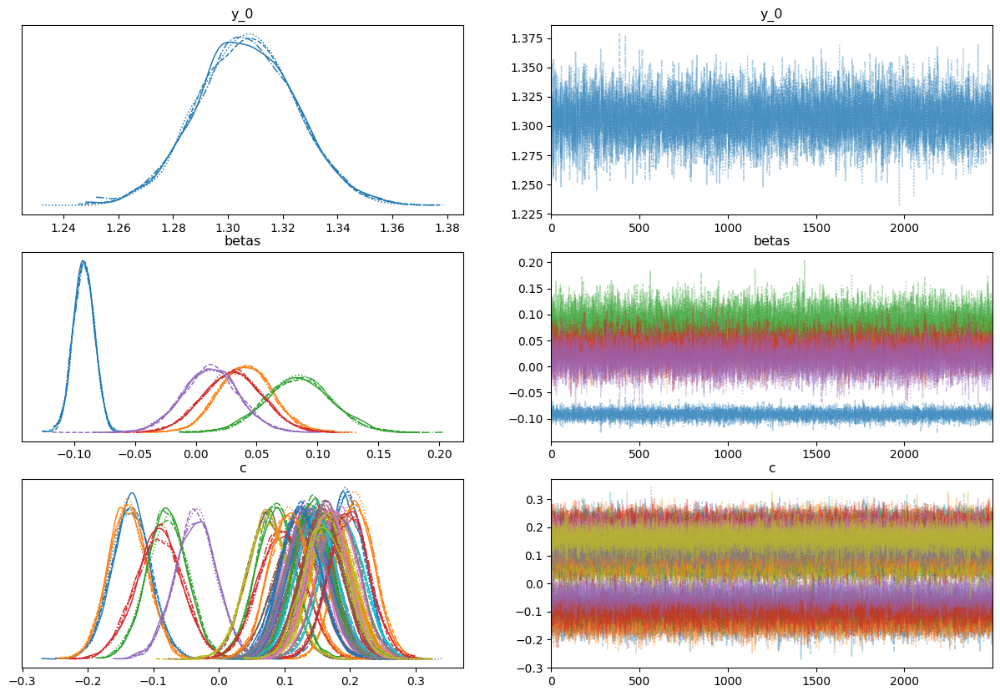

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['y_0','betas','c'], divergences=True, figsize=(15,10))

In [11]:
df_risultati = az.summary(ritorno['inference_data'], var_names=['betas'], hdi_prob=0.95)
df_risultati.loc[:,'Name'] = ['Altitude','Type_Suburban','Type_Rural','Zoning_2','Zoning_3'] #????????? Come sono state fatte le covariate?
df_risultati.set_index('Name', inplace=True)
df_risultati

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Name,,,,,,,,,
Altitude,-0.092,0.009,-0.108,-0.075,0.0,0.0,13429.0,8773.0,1.0
Type_Suburban,0.041,0.022,0.000,0.086,0.0,0.0,18357.0,7663.0,1.0
Type_Rural,0.084,0.027,0.031,0.136,0.0,0.0,18160.0,8105.0,1.0
Zoning_2,0.030,0.024,-0.018,0.077,0.0,0.0,12391.0,7872.0,1.0
Zoning_3,0.012,0.023,-0.033,0.058,0.0,0.0,12727.0,8524.0,1.0


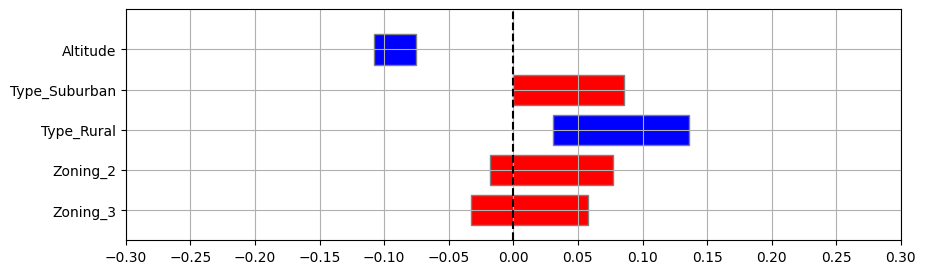

In [12]:
import time
from matplotlib.patches import Rectangle

plt.figure(figsize=(10,3))
ax = plt.subplot(1,1,1)
plt.xlim(left = -0.3, right = 0.3)
pos_rows = np.arange(0,len(df_risultati.index))
plt.ylim(bottom=-0.75, top=pos_rows[-1]+1.0)
i = 1
for row in df_risultati.index:    
    lci = df_risultati.loc[row, 'hdi_2.5%']
    rci = df_risultati.loc[row, 'hdi_97.5%']
    len_ci = rci - lci
    if lci*rci <= 0:
        col = 'red'
    else:
        col = 'blue'
    ax.add_patch(Rectangle((lci, pos_rows[-i] - 0.75/2), len_ci, 0.75,
             edgecolor = 'grey',
             facecolor = col,
             fill=True,
             lw=1))
    i += 1
    
    
plt.axvline(0, 0, pos_rows[-1]+0.75, linestyle='--', color='black')
plt.grid(axis='both')
plt.yticks(ticks=np.flip(pos_rows), labels=df_risultati.index.to_list())
plt.xticks(ticks=np.linspace(-0.3,0.3,13))
plt.show()

<AxesSubplot: ylabel='Density'>

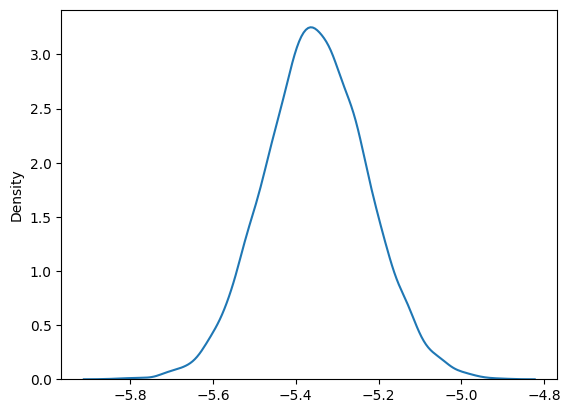

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

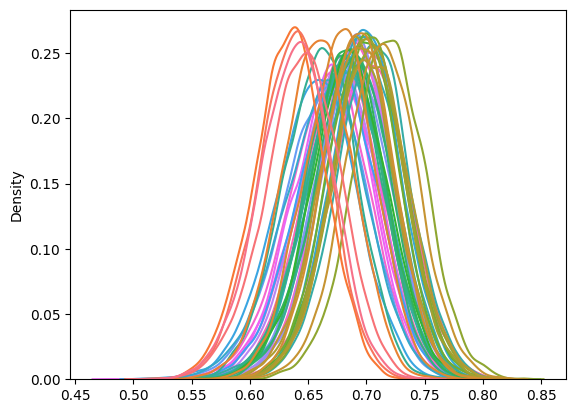

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

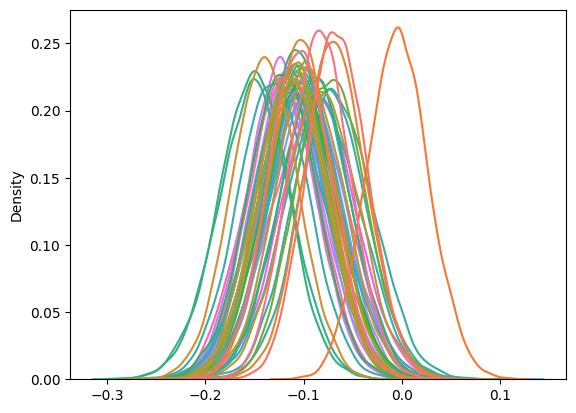

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

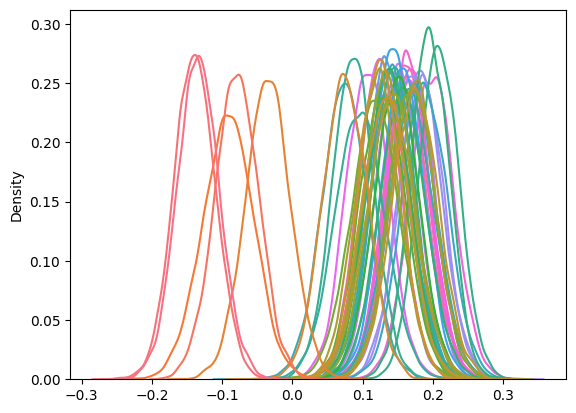

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

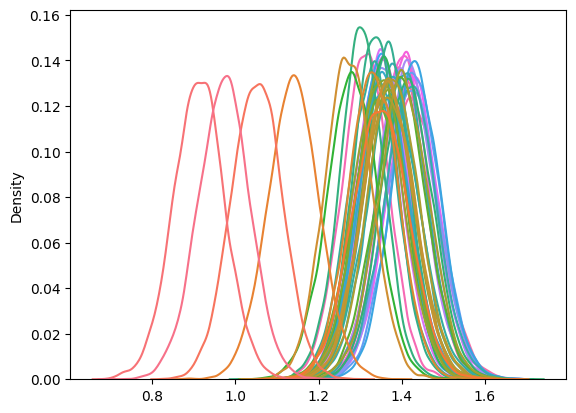

In [17]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

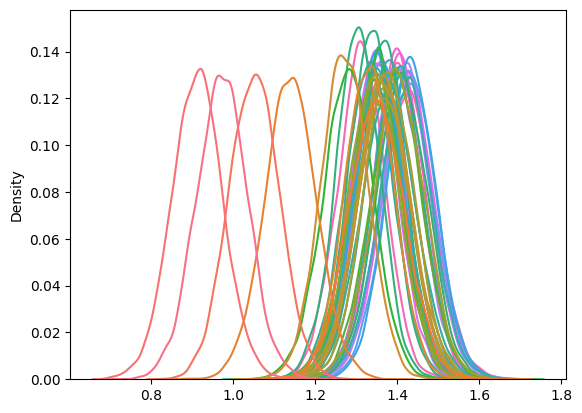

In [18]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

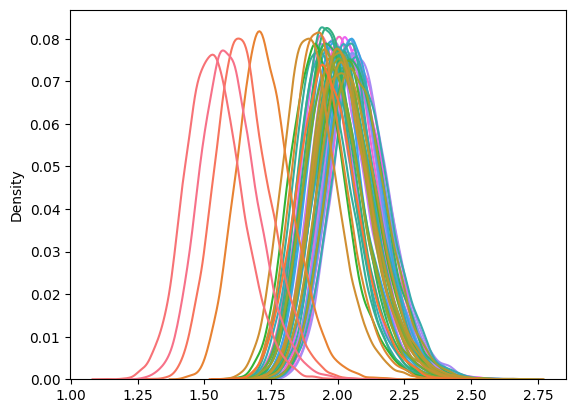

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

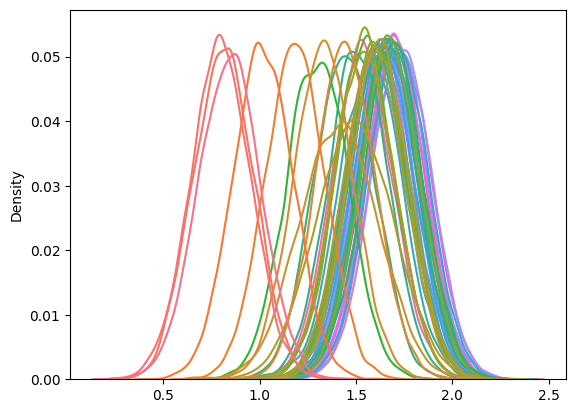

In [20]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

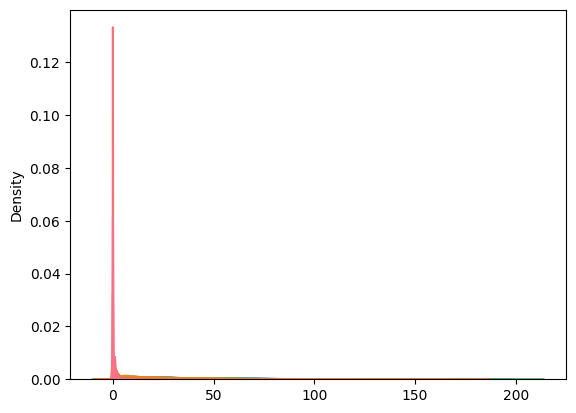

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [22]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,FEBBIO,CASTELLUCCIO,CORTE BRUGNATELLA,SAN LEO,BADIA,LUGAGNANO,VERUCCHIO,BESENZONE,SAN FRANCESCO,CASTELLARANO,GHERARDI,S. ROCCO,DELTA CERVIA,SAVIGNANO DI RIGO,VIA CHIARINI,GAVELLO,SAN PIETRO CAPOFIUME,PARCO MONTECUCCO,SARAGAT,S. LAZZARO,PARCO EDILCARANI,CITTADELLA,SAVIGNANO,GIARDINI MARGHERITA,REMESINA,MARECCHIA,FRANCHINI-ANGELONI,CENTO,PARCO BERTOZZI,VILLA FULVIA,CAORLE,PARCO RESISTENZA,PARCO FERRARI,SAN LAZZARO,PORTA SAN FELICE,MONTEBELLO,GIORDANI-FARNESE,MALCANTONE,TIMAVO,DE AMICIS,ROMA,PARADIGNA,GERBIDO,BOGOLESE,FLAMINIA,GIARDINI,CENO,ZALAMELLA,ISONZO
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.088900,0.242000,0.518000,1.658400,11.020100,14.089700,16.837300,18.176100,19.480300,20.329400,21.36450,21.736300,21.887300,22.496700,23.863300,23.898600,24.915300,25.972200,26.023300,27.877600,28.077500,28.635400,28.987000,29.153200,30.280900,30.60900,30.747000,30.889900,31.629800,32.483600,32.745600,34.145500,35.006800,36.476500,38.31910,39.277100,40.215400,40.230500,40.491100,43.092000,43.377800,45.209100,45.802600,46.167800,46.348100,46.421700,47.087500,47.689500,48.627400
std,0.354414,0.677999,1.108692,2.406136,7.924391,9.687045,11.346422,12.039817,11.469236,10.896815,14.15657,12.803099,12.822412,16.052176,14.165009,13.684862,15.842778,15.025372,14.112033,14.985682,13.541914,14.899163,15.550164,16.129642,15.542392,16.62208,16.944359,16.367558,18.132077,17.190151,18.233303,17.501079,17.200521,18.957716,18.74206,18.259092,18.930273,20.499302,19.149877,20.189678,20.412431,21.212887,22.656124,21.263044,21.166925,19.443422,22.314534,21.911634,20.719428
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,0.000000,3.000000,1.000000,1.000000,4.000000,2.000000,2.000000,2.000000
25%,0.000000,0.000000,0.000000,0.000000,5.000000,7.000000,9.000000,10.000000,11.000000,12.000000,11.00000,13.000000,13.000000,11.000000,14.000000,14.000000,14.000000,15.000000,16.000000,17.000000,18.000000,18.000000,18.000000,17.000000,19.000000,19.00000,18.000000,19.000000,19.000000,20.000000,20.000000,21.000000,23.000000,23.000000,25.00000,26.000000,27.000000,25.000000,27.000000,28.000000,28.000000,30.000000,29.000000,31.000000,31.000000,32.000000,31.000000,32.000000,34.000000
50%,0.000000,0.000000,0.000000,1.000000,9.000000,12.000000,14.000000,16.000000,17.000000,18.000000,18.00000,19.000000,19.000000,19.000000,21.000000,22.000000,22.000000,23.000000,24.000000,25.000000,26.000000,26.000000,26.000000,26.000000,28.000000,28.00000,28.000000,28.000000,28.000000,29.500000,29.000000,32.000000,32.000000,34.000000,36.00000,37.000000,37.000000,37.000000,38.000000,40.000000,40.000000,42.000000,42.000000,43.000000,43.000000,44.000000,44.000000,45.000000,46.000000
75%,0.000000,0.000000,1.000000,2.000000,15.000000,19.000000,22.000000,24.000000,26.000000,26.000000,28.00000,28.000000,29.000000,30.000000,31.000000,31.000000,33.000000,33.000000,34.000000,36.000000,35.000000,37.000000,37.000000,38.000000,39.000000,39.00000,40.000000,40.000000,41.000000,42.000000,43.000000,44.000000,45.000000,47.000000,49.00000,49.000000,51.000000,52.000000,51.000000,54.000000,55.000000,57.000

In [23]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAN LEO,BADIA,LUGAGNANO,VERUCCHIO,BESENZONE,SAN FRANCESCO,CASTELLARANO,S. ROCCO,DELTA CERVIA,GHERARDI,GAVELLO,VIA CHIARINI,SAVIGNANO DI RIGO,SAN PIETRO CAPOFIUME,SARAGAT,PARCO MONTECUCCO,PARCO EDILCARANI,S. LAZZARO,CITTADELLA,SAVIGNANO,GIARDINI MARGHERITA,REMESINA,MARECCHIA,FRANCHINI-ANGELONI,CENTO,PARCO BERTOZZI,VILLA FULVIA,CAORLE,PARCO RESISTENZA,PARCO FERRARI,SAN LAZZARO,PORTA SAN FELICE,MONTEBELLO,MALCANTONE,GIORDANI-FARNESE,TIMAVO,DE AMICIS,ROMA,GERBIDO,PARADIGNA,BOGOLESE,CENO,FLAMINIA,ZALAMELLA,GIARDINI,ISONZO
count,10000.0,10000.0,10000.0,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.012700,0.034300,0.065300,0.088000,0.088500,0.09430,0.12990,0.136100,0.140200,0.169500,0.176500,0.177800,0.210500,0.216100,0.217500,0.248000,0.258600,0.276900,0.288000,0.291100,0.31400,0.316900,0.324600,0.328900,0.341000,0.363300,0.366400,0.407700,0.427600,0.45310,0.501000,0.522000,0.532300,0.540700,0.549200,0.598500,0.601900,0.627300,0.633700,0.653200,0.660500,0.660900,0.678800,0.679400,0.715700
std,0.0,0.0,0.0,0.0,0.111982,0.182008,0.247067,0.283309,0.284035,0.29226,0.33621,0.342912,0.347212,0.375212,0.381264,0.382363,0.407684,0.411604,0.412566,0.431873,0.437887,0.447489,0.452854,0.454292,0.46414,0.465291,0.468249,0.469837,0.474069,0.480974,0.481845,0.491431,0.494755,0.49782,0.500024,0.499541,0.498981,0.498366,0.497598,0.490226,0.489531,0.483547,0.481817,0.475975,0.473563,0.473428,0.466961,0.466731,0.451103
min,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.0000

<AxesSubplot: >

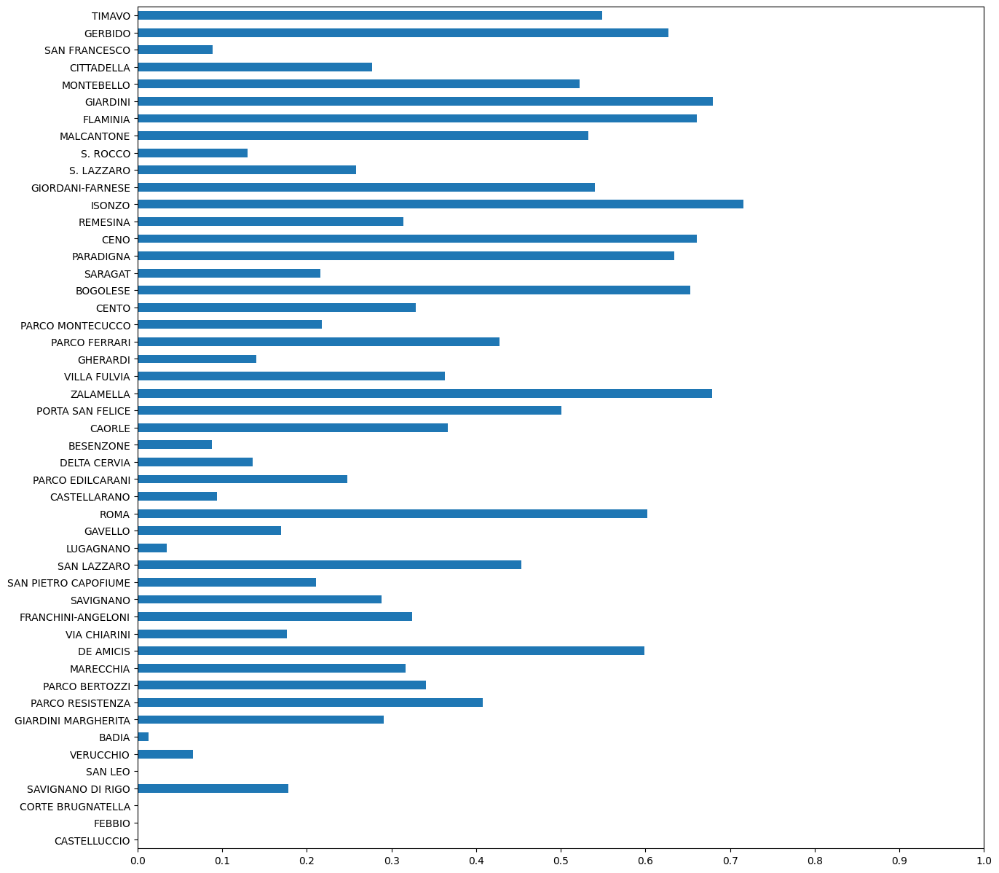

In [24]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,GHERARDI,SARAGAT,S. LAZZARO,S. ROCCO,DELTA CERVIA,PARCO EDILCARANI,CASTELLARANO,LUGAGNANO,VIA CHIARINI,CITTADELLA,CENTO,SAN FRANCESCO,FEBBIO,CORTE BRUGNATELLA,SAN LEO,VERUCCHIO,MARECCHIA,BADIA,BESENZONE,PARCO MONTECUCCO,REMESINA,SAVIGNANO,GAVELLO,PARCO FERRARI,GIARDINI,GIARDINI MARGHERITA,PARCO RESISTENZA,MONTEBELLO,FRANCHINI-ANGELONI,SAN PIETRO CAPOFIUME,SAVIGNANO DI RIGO,CAORLE,VILLA FULVIA,GIORDANI-FARNESE,PARCO BERTOZZI,TIMAVO,PORTA SAN FELICE,SAN LAZZARO,ISONZO,DE AMICIS,ROMA,MALCANTONE,FLAMINIA,PARADIGNA,ZALAMELLA,BOGOLESE,CENO,GERBIDO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0000,10000.0000,10000.0000,10000.0000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0001,0.0001,0.0001,0.0001,0.0001,0.000200,0.000300,0.000300,0.000300,0.000300,0.000300,0.000300,0.000400,0.000500,0.000900,0.000900,0.001000,0.001000,0.00110,0.00110,0.001200,0.00160,0.001700,0.002300,0.002600,0.003000,0.003700,0.00380,0.004600,0.005100
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0100,0.0100,0.0100,0.0100,0.0100,0.014141,0.017319,0.017319,0.017319,0.017319,0.017319,0.017319,0.019997,0.022356,0.029988,0.029988,0.031609,0.031609,0.03315,0.03315,0.034622,0.03997,0.041198,0.047906,0.050926,0.054693,0.060718,0.06153,0.067671,0.071236
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0000,1.0000,1.0000,1.0000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


<AxesSubplot: >

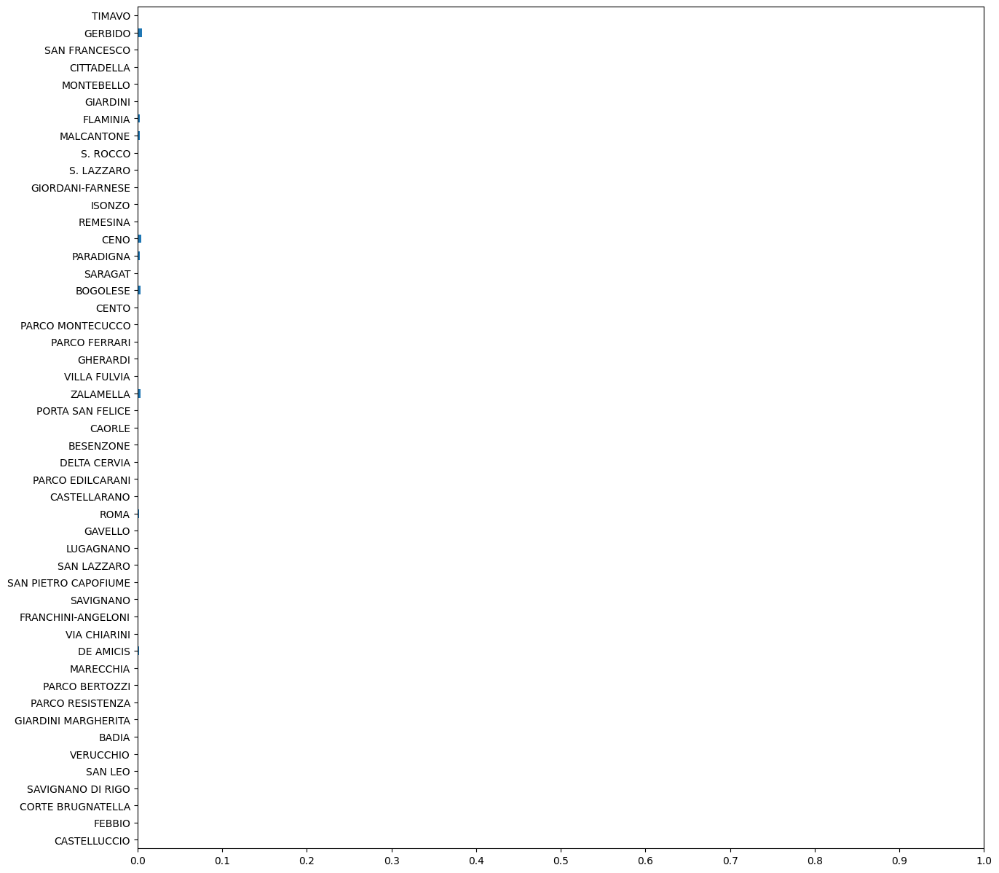

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(10000, 365, 49)

In [28]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [29]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [30]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

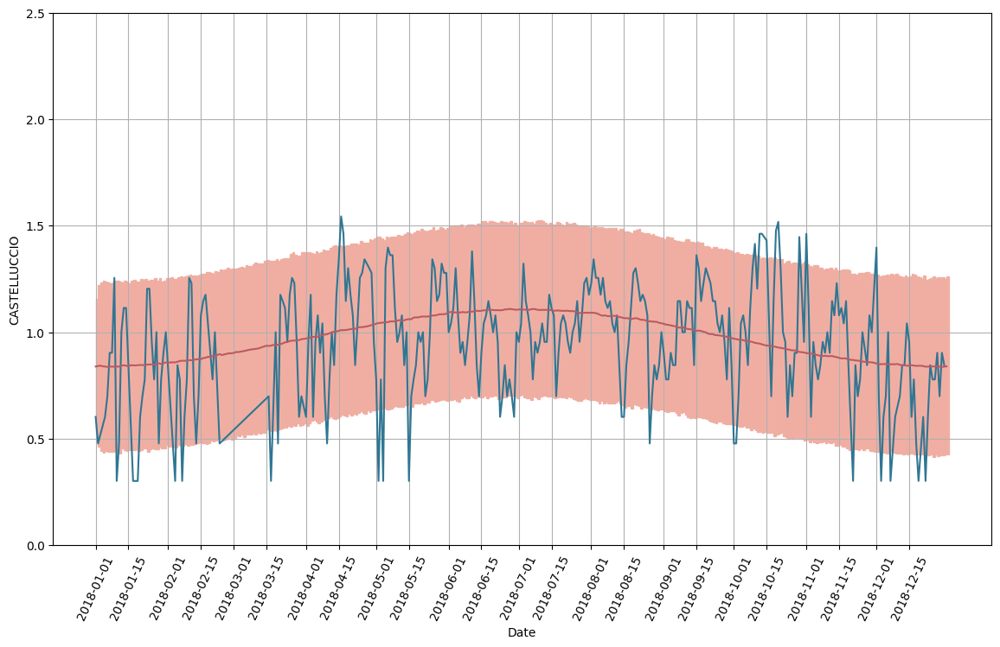

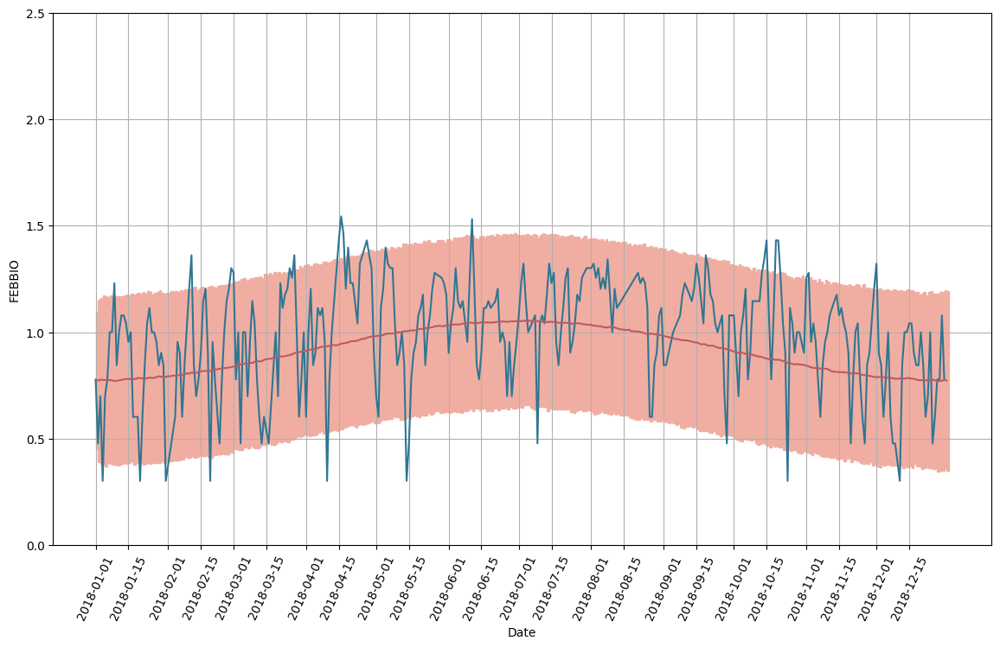

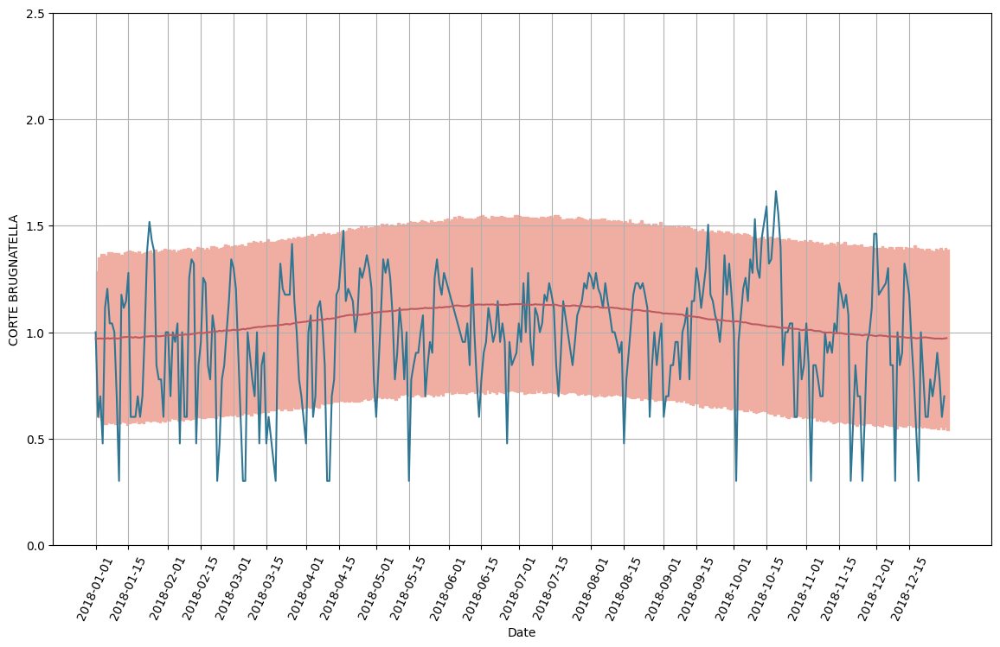

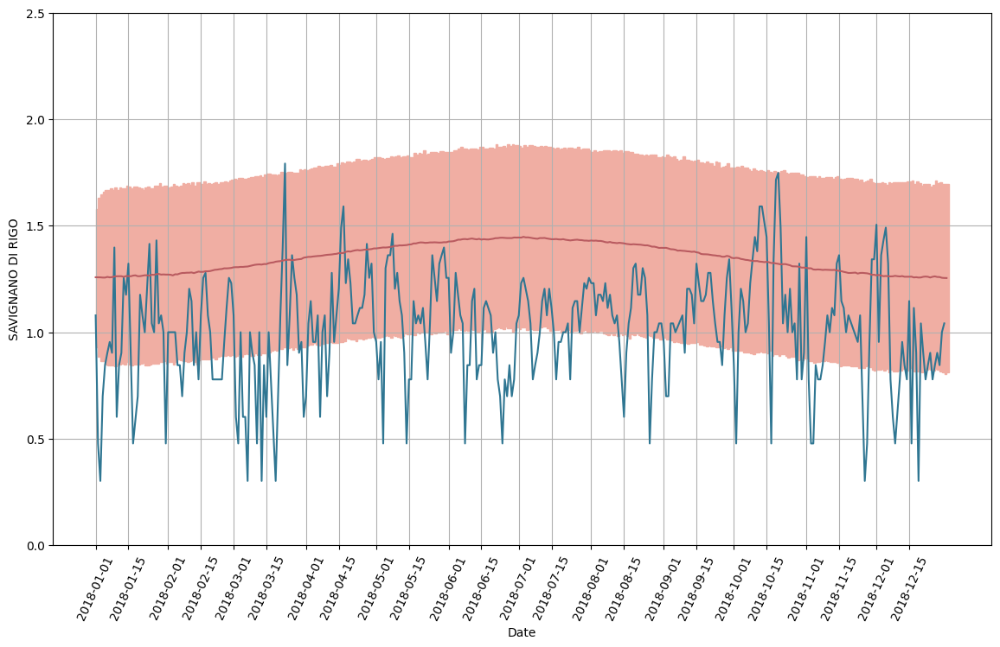

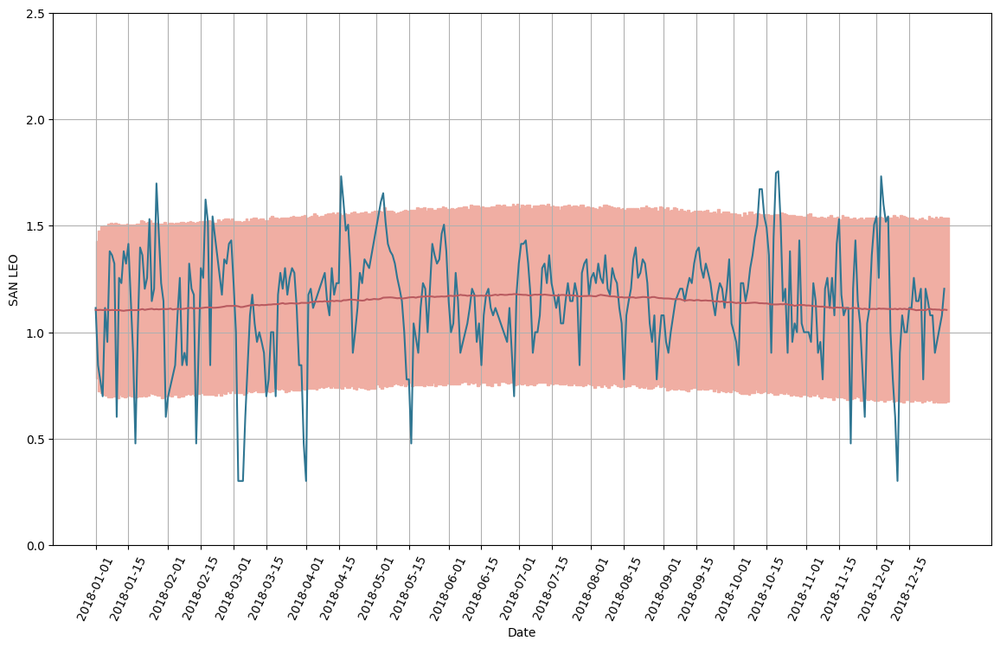

...

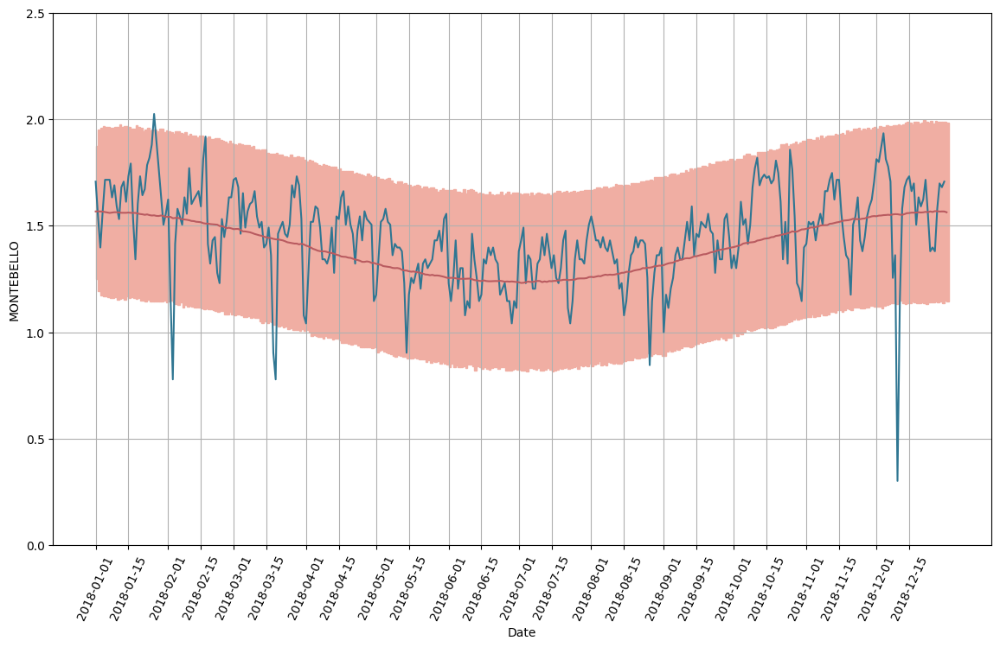

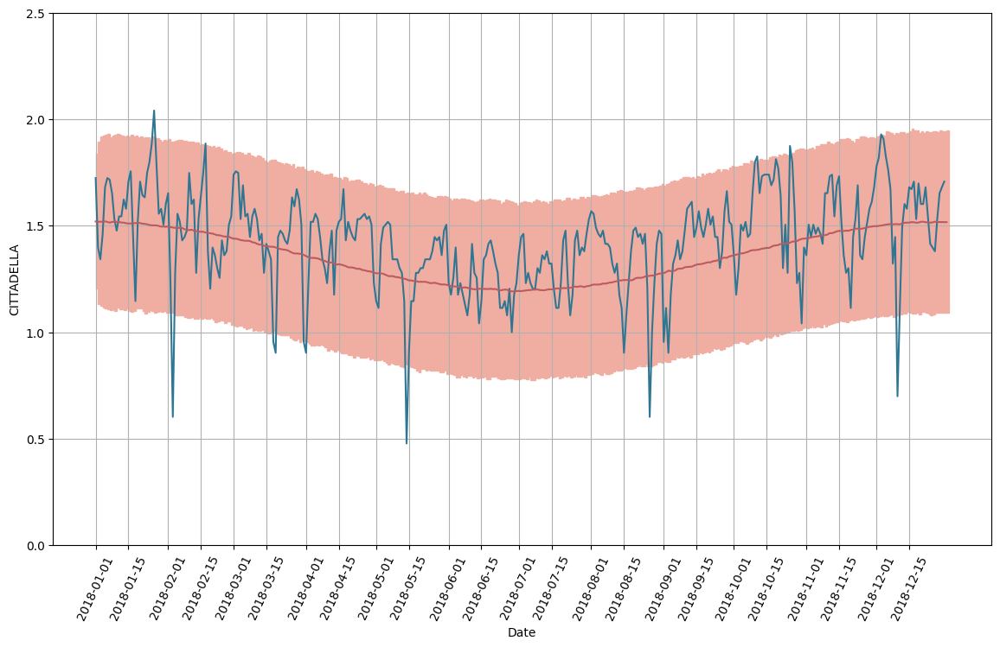

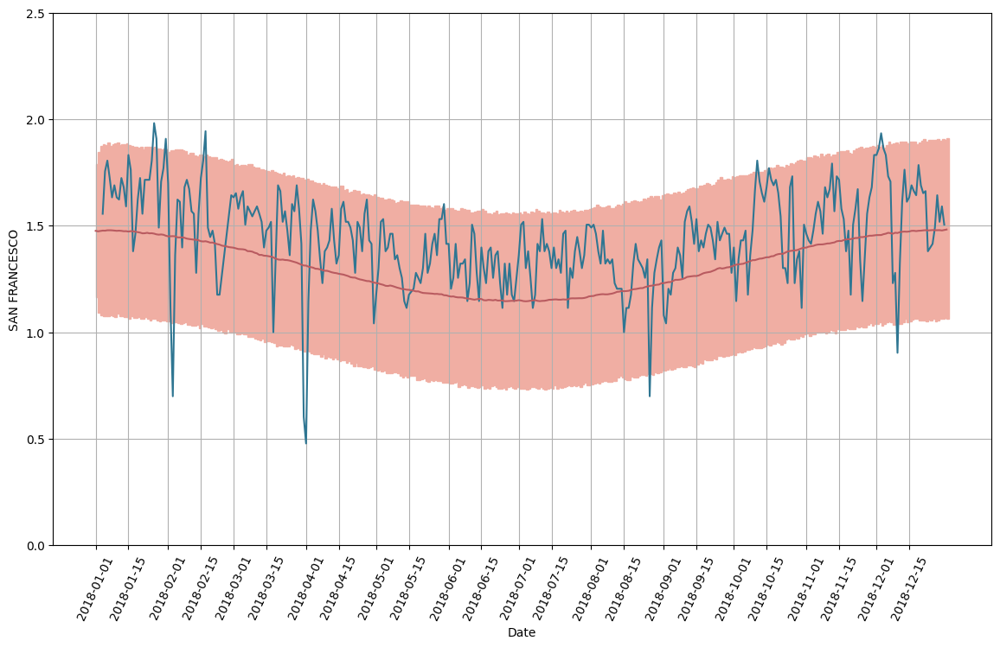

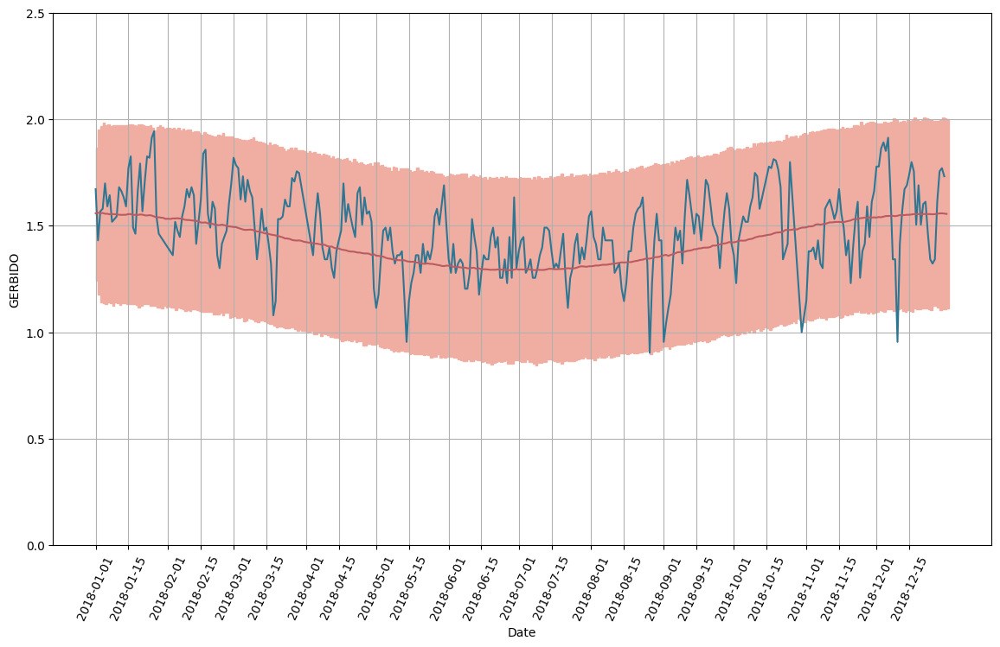

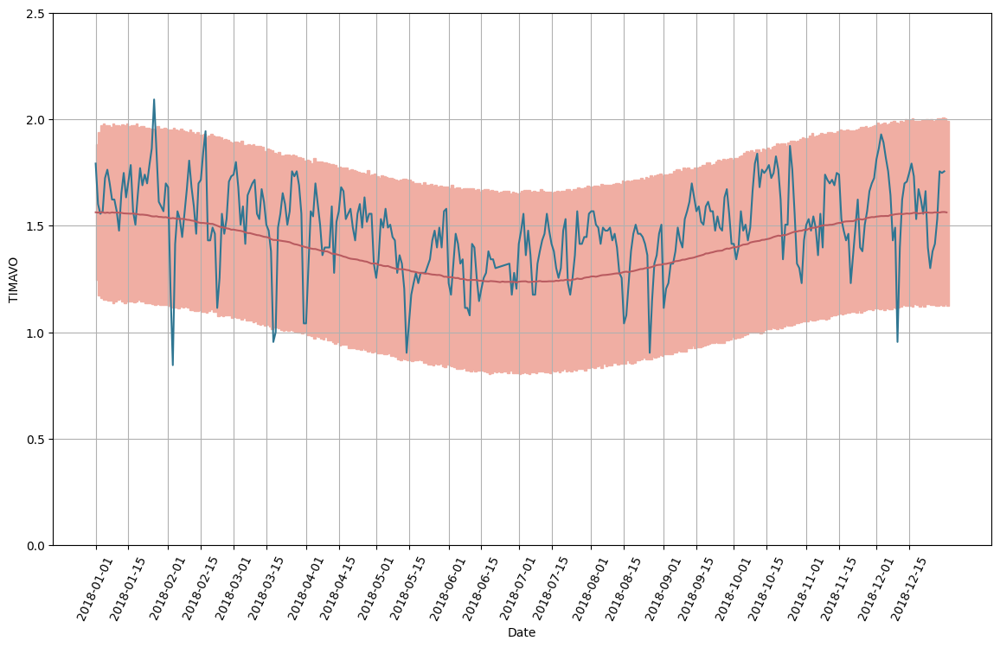

In [31]:
for stazione in df.columns:
    f(stazione)